In [2]:
import mailbox
import gensim
from gensim.models import Word2Vec
from gensim.parsing.preprocessing import *
import eml_parser, json, datetime
import email
import pandas as pd
import numpy as np
import os
import joblib

# NLP with NLTK
import nltk
nltk.download("stopwords")
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer

# For visualization
from wordcloud import WordCloud
#import pyLDAvis
#import pyLDAvis.gensim

# Sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import SVC
from sklearn.feature_extraction.text import TfidfVectorizer

# Doc2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

# Keras
import tensorflow as tf
from tensorflow.keras import layers

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\saifu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\saifu\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


!pip install wordcloud

!pip install tensorflow

# Data preprocessing

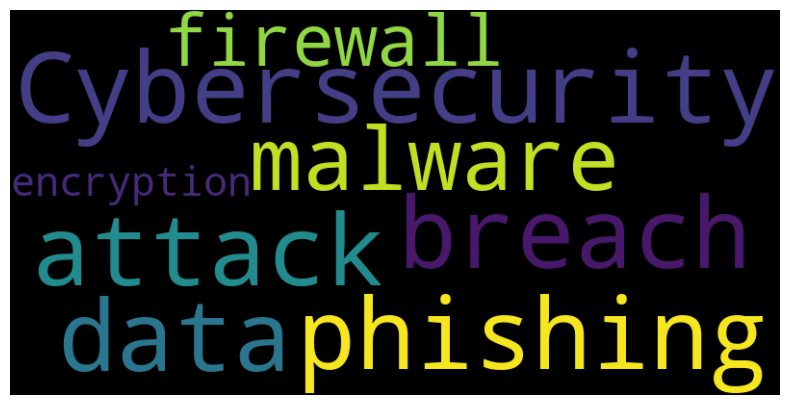

In [5]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Sample text
text = "Cybersecurity data breach phishing attack malware firewall encryption"

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Extracting the body text

In [8]:
# From https://stackoverflow.com/questions/7166922/extracting-the-body-of-an-email-from-mbox-file-decoding-it-to-plain-text-regard

def get_charsets(msg):
    charsets = set({})
    for c in msg.get_charsets():
        if c is not None:
            charsets.update([c])
    return charsets

def handle_error(errmsg, emailmsg,cs):
    '''print()
    print(errmsg)
    print("This error occurred while decoding with ",cs," charset.")
    print("These charsets were found in the one email.",get_charsets(emailmsg))
    print("This is the subject:",emailmsg['subject'])
    print("This is the sender:",emailmsg['From'])'''
    pass

def get_body_from_email(msg):
    body = None
    #Walk through the parts of the email to find the text body.    
    if msg.is_multipart():    
        for part in msg.walk():

            # If part is multipart, walk through the subparts.            
            if part.is_multipart(): 

                for subpart in part.walk():
                    if subpart.get_content_type() == 'text/plain':
                        # Get the subpart payload (i.e the message body)
                        body = subpart.get_payload(decode=True) 
                        #charset = subpart.get_charset()

            # Part isn't multipart so get the email body
            elif part.get_content_type() == 'text/plain':
                body = part.get_payload(decode=True)
                #charset = part.get_charset()

    # If this isn't a multi-part message then get the payload (i.e the message body)
    #elif msg.get_content_type() == 'text/plain':
        #body = msg.get_payload(decode=True) 
    
    # Uncomment this to also include html and other formats
    else:
        body = msg.get_payload(decode=True) 

    return body

### Phishing emails

In [11]:
phishingBoxFilenames = [ "C:/Users/saifu/Downloads/datasets/phishing3.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing1.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing0.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2022.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2021.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2020.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2019.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2018.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2017.mbox",
    "C:/Users/saifu/Downloads/datasets/phishing2016.mbox",]
phishingBoxes = [mailbox.mbox(f) for f in phishingBoxFilenames]
phishingMessages = [m[1] for phishingBox in phishingBoxes for m in phishingBox.items()]

phishingMessageBodies = []
for p in phishingMessages:
    body = get_body_from_email(p)
    if body is not None and len(body) > 0:
        phishingMessageBodies.append(body)
        
print(len(phishingMessages), len(phishingMessageBodies))

4386 2983


In [13]:
# Clair Fraud Email Database
added = []
with open("C:/Users/saifu/Downloads/datasets/fradulent_emails.txt", 'r', errors="ignore") as f:
    body = ""
    inBody = False
    for line in f:
        if line.startswith("Status: O"):
            inBody = True
        
        elif line.startswith("From r") and len(body) > 0:
            inBody = False
            added.append(body)
            body = ""

        elif inBody:
            body += line

phishingMessageBodies = list(set(phishingMessageBodies + [a for a in added if len(a) > 0]))
print(len(phishingMessageBodies))
    

3796


In [15]:
# SpamAssassin Spam (not exactly phishing, but NVIDIA article used it as phishing so attempting it)
ep = eml_parser.EmlParser(include_raw_body=True)

spamDir = "C:/Users/saifu/Downloads/datasets/spam/"
spamFilenames = [os.path.join(spamDir, f) for f in os.listdir(spamDir)]

added = []
for filename in spamFilenames:
    with open(filename, "rb") as f:
        b = f.read()
    
    m = ep.decode_email_bytes(b)
    if len(m["body"]) >= 1:
        added.append(m["body"][0]["content"])
    
phishingMessageBodies = list(set(phishingMessageBodies + added))
print(len(phishingMessageBodies))

FROM header parsing failed.
FROM header parsing failed.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
FROM header parsing failed.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
FROM header parsing failed.
FROM header parsing failed.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invali

6458


ep = eml_parser.EmlParser(include_raw_body=True)

spamDir = "C:/Users/saifu/Downloads/datasets/spam/"
spamFilenames = [os.path.join(spamDir, f) for f in os.listdir(spamDir)]

added = []
for filename in spamFilenames:
    try:
        with open(filename, "rb") as f:
            b = f.read()
        
        # Parse email content
        m = ep.decode_email_bytes(b)
        if "body" in m and len(m["body"]) >= 1:
            added.append(m["body"][0].get("content", ""))
    except Exception as e:
        # Log the problematic file and the error
        print(f"Error processing file {filename}: {e}")

# Deduplicate phishing messages
phishingMessageBodies = list(set(phishingMessageBodies + added))
print(f"Total phishing messages processed: {len(phishingMessageBodies)}")

### Benign emails

when referring to "easy ham" and "hard ham" in the context of spam detection datasets, it typically means that "easy ham" refers to readily identifiable, clear non-spam messages, while "hard ham" indicates messages that are more ambiguous or could be easily mistaken for spam, making them harder for a machine learning model to accurately classify as "ham" (legitimate) messages

In [18]:
ep = eml_parser.EmlParser(include_raw_body=True)

easyHamDir = "C:/Users/saifu/Downloads/datasets/easy_ham/"
hardHamDir = "C:/Users/saifu/Downloads/datasets/hard_ham/"
hamFilenames = [os.path.join(easyHamDir, f) for f in os.listdir(easyHamDir)] + [os.path.join(hardHamDir, f) for f in os.listdir(hardHamDir)]

benignMessageBodies = []
for filename in hamFilenames:
    with open(filename, "rb") as f:
        b = f.read()
    
    m = ep.decode_email_bytes(b)
    if len(m["body"]) >= 1:
        benignMessageBodies.append(m["body"][0]["content"])
    
print(len(benignMessageBodies))

Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.
Header field "message-id" is in an invalid format and cannot be fixed, it will be dropped.

1652


In [19]:
import email
import email.utils
import random
import datetime

def generate_email(sender, receiver, subject, body):
    msg = email.message.EmailMessage()
    msg['From'] = sender
    msg['To'] = receiver
    msg['Subject'] = subject
    msg['Date'] = email.utils.formatdate(localtime=True)
    msg['Message-ID'] = email.utils.make_msgid()
    msg.set_content(body)
    return msg

def generate_random_email():
    senders = ["john.doe@example.com", "jane.smith@example.com", "support@example.com", "newsletter@example.com"]
    receivers = ["jane.smith@example.com", "john.doe@example.com", "support@example.com"]
    subjects = ["Meeting Reminder", "Re: Meeting Reminder", "Your Recent Support Ticket", "Monthly Newsletter"]
    bodies = [
        "Hi, just a quick reminder about our meeting tomorrow at 10 AM.",
        "Thanks for the reminder. I've reviewed the agenda and I'm all set for tomorrow.",
        "We have received your support ticket and will be addressing it shortly.",
        "Welcome to the October edition of our newsletter! This month, we're covering new product launches and upcoming events."
    ]

    sender = random.choice(senders)
    receiver = random.choice(receivers)
    subject = random.choice(subjects)
    body = random.choice(bodies)

    return generate_email(sender, receiver, subject, body)

def generate_mbox_file(filename, num_emails):
    with open(filename, 'w') as mbox_file:
        for i in range(num_emails):
            email_msg = generate_random_email()
            mbox_file.write(f"From {email_msg['From']} {datetime.datetime.now().strftime('%a %b %d %H:%M:%S %Y')}\n")
            for header, value in email_msg.items():
                mbox_file.write(f"{header}: {value}\n")
            mbox_file.write("\n")
            mbox_file.write(email_msg.get_content())
            mbox_file.write("\n\n")

if __name__ == "__main__":
    generate_mbox_file("benign.mbox", 100)
    print("Generated 100 benign emails in 'benign.mbox'")

Generated 100 benign emails in 'benign.mbox'


In [23]:
# Personal, benign emails
personalBox = mailbox.mbox("C:/Users/saifu/Downloads/datasets/benign.mbox")
personalMessages = [m[1] for m in personalBox.items()][:len(phishingMessageBodies)//3] # limit amount added

added = []
for p in personalMessages:
    body = get_body_from_email(p)
    if body is not None and len(body) > 0:
        added.append(body)

benignMessageBodies += added
print(len(benignMessageBodies))

1752


In [25]:
import os
import email
from email import policy
from email.parser import BytesParser

def get_body_from_email(email_message):
    """
    Extract the plain text body from an email message.
    Handles both multipart and non-multipart emails.
    """
    if email_message.is_multipart():
        for part in email_message.walk():
            content_type = part.get_content_type()
            if content_type == "text/plain":
                return part.get_payload(decode=True).decode("utf-8", errors="ignore")
    else:
        return email_message.get_payload(decode=True).decode("utf-8", errors="ignore")

def process_email_directory(directory_path):
    """
    Process all emails in a directory and extract their bodies.
    """
    email_bodies = []
    for root, _, filenames in os.walk(directory_path):
        for filename in filenames:
            file_path = os.path.join(root, filename)
            try:
                with open(file_path, "rb") as f:
                    # Parse the email file
                    email_message = BytesParser(policy=policy.default).parse(f)
                    # Extract the body
                    body = get_body_from_email(email_message)
                    if body and len(body) > 0:
                        email_bodies.append(body)
            except Exception as e:
                print(f"Error processing file {file_path}: {e}")
    return email_bodies

# Path to your email directory
enronMailDir = "C:/Users/saifu/Downloads/enron_mail_20150507/maildir/"

# Process the directory and extract email bodies
added = process_email_directory(enronMailDir)

# Limit the amount added, so that benign is not >> phishing
if len(added) + len(benignMessageBodies) > len(phishingMessageBodies):
    toAdd = round((1.1 * len(phishingMessageBodies)) - len(benignMessageBodies))
    print(f"Adding {toAdd} emails to balance the dataset.")
    added = added[:toAdd]

# Add the processed emails to the benignMessageBodies list
benignMessageBodies += added
print(f"Total benign emails: {len(benignMessageBodies)}")

Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\all_documents\1.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\\all_documents\\1.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\all_documents\10.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\\all_documents\\10.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\all_documents\100.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\\all_documents\\100.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\all_documents\101.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\\all_documents\\101.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\all_documents\102.: [Errno 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\deleted_items\544.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\\deleted_items\\544.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\deleted_items\545.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\\deleted_items\\545.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\deleted_items\546.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\\deleted_items\\546.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\deleted_items\547.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\\deleted_items\\547.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/blair-l\deleted_items\548.: [

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\discussion_threads\1.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\\discussion_threads\\1.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\discussion_threads\10.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\\discussion_threads\\10.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\discussion_threads\100.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\\discussion_threads\\100.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\discussion_threads\1000.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/campbell-l\\discussion_threads\\1000.'
Error processing file C:/Users/saifu/Downloa

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\sent_items\288.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\\sent_items\\288.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\sent_items\289.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\\sent_items\\289.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\sent_items\29.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\\sent_items\\29.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\sent_items\290.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\\sent_items\\290.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/dasovich-j\sent_items\291.: [Er

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\deleted_items\1.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\\deleted_items\\1.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\deleted_items\10.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\\deleted_items\\10.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\deleted_items\100.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\\deleted_items\\100.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\deleted_items\101.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\\deleted_items\\101.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/gay-r\deleted_items\102.: [Errno 2] No such file or

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\deleted_items\219.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\\deleted_items\\219.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\deleted_items\22.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\\deleted_items\\22.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\deleted_items\220.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\\deleted_items\\220.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\deleted_items\221.: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedicke-m\\deleted_items\\221.'
Error processing file C:/Users/saifu/Downloads/enron_mail_20150507/maildir/haedick

KeyboardInterrupt: 

Enron email communication network covers all the email communication within a dataset of around half million emails. This data was originally made public, and posted to the web, by the Federal Energy Regulatory Commission during its investigation. Nodes of the network are email addresses and if an address i sent at least one email to address j, the graph contains an undirected edge from i to j. Note that non-Enron email addresses act as sinks and sources in the network as we only observe their communication with the Enron email addresses

In [27]:
enronMailDir = "C:/Users/saifu/Downloads/enron_mail_20150507/maildir/"

enronMessages = []
for directory, subdir, filenames in os.walk(enronMailDir):
    for filename in filenames:
        with open(os.path.join(directory, filename), "rb") as f:
            m = email.parser.Parser().parsestr(f.read().decode("utf-8", errors="ignore"))
            enronMessages.append(m)

added = []
for m in enronMessages:
    body = get_body_from_email(m)
    if body is not None and len(body) > 0:
        added.append(body)

# limit the amount added, so that benign is not >> phishing
if len(added) + len(benignMessageBodies) > len(phishingMessageBodies):
    toAdd = round((1.1 * len(phishingMessageBodies)) - len(benignMessageBodies))
    print(toAdd)
    added = added[:toAdd]

benignMessageBodies += added
print(len(benignMessageBodies))

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/saifu/Downloads/enron_mail_20150507/maildir/allen-p\\all_documents\\1.'

In [31]:
import os
import email
import mailbox

# Define the path to the mbox file
enronMboxFile = "C:/Users/saifu/Downloads/datasets/enron.mbox"

# List to store extracted email messages
enronMessages = []

# Open and parse the mbox file
mbox = mailbox.mbox(enronMboxFile)  # No 'with' statement
for msg in mbox:
    if isinstance(msg, email.message.Message):
        enronMessages.append(msg)

# Close the mbox explicitly
mbox.close()

# Extract email bodies
added = []
for m in enronMessages:
    body = get_body_from_email(m)
    if body is not None and len(body) > 0:
        added.append(body)

# Limit the number of benign messages to balance with phishing messages
if len(added) + len(benignMessageBodies) > len(phishingMessageBodies):
    toAdd = round((1.1 * len(phishingMessageBodies)) - len(benignMessageBodies))
    print(f"Adding {toAdd} messages to balance the dataset")
    added = added[:toAdd]

benignMessageBodies += added
print(f"Total benign messages: {len(benignMessageBodies)}")


Total benign messages: 1769


## Simple preprocessing

In [34]:
# Custom stop words and preprocessing filters

stopWords = nltk.corpus.stopwords
stopWords = stopWords.words("english")
stopWords.extend(["nbsp", "font", "sans", "serif", "bold", "arial", "verdana", "helvetica", "http", "https", "www", "html", "enron", "margin", "spamassassin"])

def remove_custom_stopwords(p):
    return remove_stopwords(p, stopwords=stopWords)

CUSTOM_FILTERS = [lambda x: x.lower(), strip_tags, strip_punctuation, strip_multiple_whitespaces, strip_numeric, remove_custom_stopwords, remove_stopwords, strip_short, stem_text]

In [36]:
# Decode to utf-8 as needed

# Phishing
phishingDecoded = []
for b in phishingMessageBodies:
    try:
        p = b.decode("utf-8", errors="ignore")
    except AttributeError:
        p = b
    phishingDecoded.append(p)
phishingMessageBodies = phishingDecoded

# Benign
benignDecoded = []
for b in benignMessageBodies:
    try:
        p = b.decode("utf-8", errors="ignore")
    except AttributeError:
        p = b
    benignDecoded.append(p)
benignMessageBodies = benignDecoded

In [38]:
# Phishing emails
phishingPreprocessed = []
for b in phishingMessageBodies:
    p = preprocess_string(b, filters=CUSTOM_FILTERS)
    #p = gensim.parsing.preprocessing.remove_stopwords(p, stopwords=stopWords
    
    phishingPreprocessed.append(p)
print(len(phishingPreprocessed))

6458


In [40]:
# Benign emails
benignPreprocessed = []
for b in benignMessageBodies:
    p = preprocess_string(b, filters=CUSTOM_FILTERS)
    benignPreprocessed.append(p)
print(len(benignPreprocessed))

1769


# Word2vec

In [43]:
# Train the model on all messages
model = Word2Vec(phishingPreprocessed + benignPreprocessed, min_count=1, workers=3, window=5)

In [45]:
model.wv.most_similar("dollar", topn=20)

[('million', 0.9149783849716187),
 ('thousand', 0.8549448251724243),
 ('sterl', 0.8492395877838135),
 ('emillion', 0.8487110733985901),
 ('pound', 0.8469666838645935),
 ('llar', 0.835522472858429),
 ('yuan', 0.8289530277252197),
 ('thirti', 0.8205270171165466),
 ('musd', 0.8063482046127319),
 ('millon', 0.7973470091819763),
 ('billion', 0.7952811121940613),
 ('ten', 0.7930501103401184),
 ('milion', 0.788557231426239),
 ('sum', 0.7848494052886963),
 ('acr', 0.7830194234848022),
 ('darpa', 0.7711877226829529),
 ('usand', 0.770952582359314),
 ('seven', 0.7681387662887573),
 ('seventi', 0.7670552134513855),
 ('cinq', 0.7668139338493347)]

In [47]:
model.wv["dollar"]

array([-1.5568954 ,  1.183169  , -0.90713406, -1.6613078 ,  1.9704622 ,
        0.9009346 , -0.32109317,  4.592653  , -2.0108209 , -0.65401226,
        1.7646916 ,  1.8295078 , -1.4294436 , -0.67195123,  0.5210526 ,
       -0.63757634, -1.7875391 , -1.1229954 , -0.15842919, -1.4426968 ,
       -1.6959999 , -0.9681074 ,  1.3151027 ,  0.6422991 , -0.26922002,
       -2.7695038 , -2.1118817 , -4.010792  , -0.7731843 ,  3.0413585 ,
        0.31809986,  1.0288203 ,  1.2194866 , -1.7638832 ,  1.2308697 ,
        1.5809008 , -3.9784577 , -1.1758552 ,  0.3055393 , -3.365545  ,
        0.22774825,  0.07822642, -0.10076272,  1.6799155 ,  1.0667933 ,
       -1.6435342 ,  0.44935513,  1.514294  ,  0.39060256,  1.0292717 ,
        1.4713255 , -1.1554369 , -0.6097087 ,  1.9331695 , -1.6556364 ,
        0.54587156,  1.5294331 ,  0.76130116,  1.6032996 , -0.14949456,
        2.2185102 , -0.13947752, -2.2652955 , -3.5896475 , -2.0384521 ,
        1.3445406 ,  1.0409696 , -0.88005745, -0.5780526 , -0.91

# Wordcloud

## Both

In [51]:
#cloudString = ','.join(','.join(list(phishingPreprocessed + benignPreprocessed)))
'''cloudString = ""
for doc in phishingPreprocessed + benignPreprocessed:
    cloudString += ",".join(doc)'''

'cloudString = ""\nfor doc in phishingPreprocessed + benignPreprocessed:\n    cloudString += ",".join(doc)'

In [53]:
'''wordCloud = WordCloud(max_words=5000, background_color="white")
wordCloud.generate(cloudString)
wordCloud.to_image()'''

'wordCloud = WordCloud(max_words=5000, background_color="white")\nwordCloud.generate(cloudString)\nwordCloud.to_image()'

# LDA Topic Modeling

In [56]:
numTopics = 1024

## Both

In [59]:
# Create dictionary and corpus
dictionary = gensim.corpora.Dictionary(phishingPreprocessed + benignPreprocessed)
corpus = [dictionary.doc2bow(text) for text in phishingPreprocessed + benignPreprocessed] # Term document frequency

In [61]:
joblib.dump(dictionary, "C:/Users/saifu/Downloads/datasets/ldaDictionary.joblib")

['C:/Users/saifu/Downloads/datasets/ldaDictionary.joblib']

In [63]:
# Create model
ldaModel = gensim.models.LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=numTopics)

OSError: [Errno 22] Invalid argument

In [67]:
ldaModel = gensim.models.LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=numTopics,
    passes=10
)


In [69]:
# Print keyword for the topics
print(ldaModel.print_topics())

[(809, '0.067*"confirm" + 0.064*"account" + 0.057*"polici" + 0.054*"avenu" + 0.044*"hamilton" + 0.038*"moment" + 0.032*"san" + 0.030*"jose" + 0.028*"locat" + 0.025*"regist"'), (629, '0.547*"shtml" + 0.084*"pdt" + 0.069*"hotlin" + 0.042*"characterist" + 0.034*"countri" + 0.032*"stylish" + 0.018*"romania" + 0.012*"emm" + 0.009*"log" + 0.008*"poland"'), (414, '0.367*"sick" + 0.207*"treasur" + 0.039*"get" + 0.034*"endeavour" + 0.015*"remarri" + 0.011*"ebut" + 0.010*"eif" + 0.009*"disturb" + 0.006*"somba" + 0.004*"hogan"'), (399, '0.161*"home" + 0.077*"rate" + 0.055*"loan" + 0.052*"mortgag" + 0.035*"oblig" + 0.031*"click" + 0.030*"credit" + 0.024*"refin" + 0.024*"year" + 0.024*"pull"'), (480, '0.321*"seen" + 0.257*"forget" + 0.089*"cnn" + 0.053*"talent" + 0.041*"strength" + 0.038*"nbc" + 0.025*"discoveri" + 0.023*"chang" + 0.020*"actual" + 0.018*"maillist"'), (849, '0.000*"govern" + 0.000*"monei" + 0.000*"judg" + 0.000*"site" + 0.000*"logo" + 0.000*"court" + 0.000*"com" + 0.000*"new" + 0.00

In [71]:
joblib.dump(ldaModel, "C:/Users/saifu/Downloads/datasets/ldaModel.joblib")

['C:/Users/saifu/Downloads/datasets/ldaModel.joblib']

In [73]:
'''# Visualize LDA
pyLDAvis.enable_notebook()

ldavis = pyLDAvis.gensim.prepare(ldaModel, corpus, dictionary)
pyLDAvis.save_html(ldavis, "../results/ldavis_both.html")
#ldavis'''

'# Visualize LDA\npyLDAvis.enable_notebook()\n\nldavis = pyLDAvis.gensim.prepare(ldaModel, corpus, dictionary)\npyLDAvis.save_html(ldavis, "../results/ldavis_both.html")\n#ldavis'

## Phishing

In [76]:
'''# Create dictionary and corpus
dictionaryPhishing= gensim.corpora.Dictionary(phishingPreprocessed)
corpusPhishing = [dictionaryPhishing.doc2bow(text) for text in phishingPreprocessed] # Term document frequency'''

'# Create dictionary and corpus\ndictionaryPhishing= gensim.corpora.Dictionary(phishingPreprocessed)\ncorpusPhishing = [dictionaryPhishing.doc2bow(text) for text in phishingPreprocessed] # Term document frequency'

In [78]:
'''# Create model
ldaModelPhishing = gensim.models.LdaMulticore(corpus=corpusPhishing, id2word=dictionaryPhishing, num_topics=numTopics)'''

'# Create model\nldaModelPhishing = gensim.models.LdaMulticore(corpus=corpusPhishing, id2word=dictionaryPhishing, num_topics=numTopics)'

In [80]:
'''# Visualize LDA
pyLDAvis.enable_notebook()

ldavisPhishing = pyLDAvis.gensim.prepare(ldaModelPhishing, corpusPhishing, dictionaryPhishing)
pyLDAvis.save_html(ldavisPhishing, "../results/ldavis_phishing.html")
#ldavisPhishing'''

'# Visualize LDA\npyLDAvis.enable_notebook()\n\nldavisPhishing = pyLDAvis.gensim.prepare(ldaModelPhishing, corpusPhishing, dictionaryPhishing)\npyLDAvis.save_html(ldavisPhishing, "../results/ldavis_phishing.html")\n#ldavisPhishing'

## Benign

In [83]:
'''# Create dictionary and corpus
dictionaryBenign = gensim.corpora.Dictionary(benignPreprocessed)
corpusBenign = [dictionaryBenign.doc2bow(text) for text in benignPreprocessed] # Term document frequency'''

'# Create dictionary and corpus\ndictionaryBenign = gensim.corpora.Dictionary(benignPreprocessed)\ncorpusBenign = [dictionaryBenign.doc2bow(text) for text in benignPreprocessed] # Term document frequency'

In [85]:
'''# Create model
ldaModelBenign = gensim.models.LdaMulticore(corpus=corpusBenign, id2word=dictionaryBenign, num_topics=numTopics)'''

'# Create model\nldaModelBenign = gensim.models.LdaMulticore(corpus=corpusBenign, id2word=dictionaryBenign, num_topics=numTopics)'

In [87]:
'''# Visualize LDA
pyLDAvis.enable_notebook()

ldavisBenign = pyLDAvis.gensim.prepare(ldaModelBenign, corpusBenign, dictionaryBenign)
pyLDAvis.save_html(ldavisBenign, "../results/ldavis_benign.html")
#ldavisBenign'''

'# Visualize LDA\npyLDAvis.enable_notebook()\n\nldavisBenign = pyLDAvis.gensim.prepare(ldaModelBenign, corpusBenign, dictionaryBenign)\npyLDAvis.save_html(ldavisBenign, "../results/ldavis_benign.html")\n#ldavisBenign'

# Doc2Vec

In [90]:
taggedDocs = [TaggedDocument(doc, [i]) for i, doc in enumerate(phishingPreprocessed + benignPreprocessed)]

In [92]:
doc2VecModel = Doc2Vec(taggedDocs, vector_size=20, window=2, min_count=1, workers=4)

In [96]:
joblib.dump(doc2VecModel, "C:/Users/saifu/Downloads/datasets/doc2VecModel.joblib")

['C:/Users/saifu/Downloads/datasets/doc2VecModel.joblib']

# Classification

In [99]:
allPreprocessed = phishingPreprocessed + benignPreprocessed
allBodies = phishingMessageBodies + benignMessageBodies

In [101]:
# Blacklisted words and phrases pulled form spam wordlist
# Will be a list of lists. Each phrase/words is a list of preprocessed words If a given email has all of the stemmed/preprocessed words in a given list, it's a hit.

blackListWords = []
with open("spam_wordlist.txt", 'r') as f:
    for line in f:
        blackListWords.append(line)

blackList = []
for b in blackListWords:
    blackListEntry = preprocess_string(b, filters=CUSTOM_FILTERS)
    if len(blackListEntry) > 0 and blackListEntry not in blackList:
        blackList.append(blackListEntry)

In [103]:
# TF-IDF for the top set amount of words
maximumTermCount = 6

def preprocessor_func(s):
    sentence = " ".join(preprocess_string(s, filters=CUSTOM_FILTERS))
    return sentence

tfIDFVectorizer = TfidfVectorizer(max_features=maximumTermCount, preprocessor=preprocessor_func, sublinear_tf=True)
tfIDF = tfIDFVectorizer.fit_transform(allBodies).toarray()
print(tfIDFVectorizer.get_feature_names_out())
print(tfIDF.shape)

['account' 'com' 'email' 'list' 'mail' 'net']
(8227, 6)


In [105]:
joblib.dump(tfIDF, "C:/Users/saifu/Downloads/datasets/tfIDF.joblib")

['C:/Users/saifu/Downloads/datasets/tfIDF.joblib']

In [107]:
def count_all_upper_word(text):
    count = 0 
    for word in text.split():
        if word.upper() == word:
            count += 1

    return count

In [109]:
allVectors = []
for i in range(len(allBodies)):
    topTopics = ldaModel.get_document_topics(corpus[i], minimum_probability=0.0)
    
    # Can extend this array with other stuff later
    vec = [topTopics[i][1] for i in range(numTopics)] # Topics

    for v in doc2VecModel.infer_vector(allPreprocessed[i]): # Doc2Vec
        vec.append(v)

    # Sentiment analysis of polarity
    sia = SentimentIntensityAnalyzer()
    sentence = " ".join(allPreprocessed[i])
    polarity = sia.polarity_scores(sentence)
    for s in polarity:
        vec.append(polarity[s])

    # Contains HTML
    if "<html>" in allBodies[i].lower():
        vec.append(1)
    else:
        vec.append(0)

    # Contains a link (how many)
    if "http://" in allBodies[i].lower() or "https://" in allBodies[i].lower():
        vec.append(1)
    else:
        vec.append(0)

    # How many blacklisted phrases/words appear in this email
    for b in blackList:
        count = 0
        for word in b:
            if word in allPreprocessed[i]:
                count += 1
        vec.append(count)

    # TF-IDF for top terms
    for w in tfIDF[i]:
        vec.append(w)

    # Has all caps word?
    vec.append(count_all_upper_word(allBodies[i]))

    # Has exclamation marks?
    vec.append(allBodies[i].count("!"))

    # Total length
    vec.append(len(allBodies[i]))

    # Num words
    vec.append(len(allPreprocessed[i]))
    
    allVectors.append(vec)

In [113]:
print(np.array(allVectors).shape)

(8227, 1429)


In [115]:
allLabels = []
for i in range(len(phishingPreprocessed)):
    allLabels.append(1)
for i in range(len(benignPreprocessed)):
    allLabels.append(0)

In [117]:
# Scale and split data
#scaler = MinMaxScaler()
scaler = StandardScaler()
scaler.fit(allVectors)
X_train, X_test, y_train, y_test = train_test_split(scaler.transform(allVectors), allLabels, test_size=0.2, shuffle=True)

## Random Forest

In [120]:
rf = RandomForestClassifier()
#rf = make_pipeline(StandardScaler(), RandomForestClassifier())
rf.fit(X_train, y_train)

RandomForestClassifier()

In [122]:
y_pred = rf.predict(X_test)

rfcAccuracy = accuracy_score(y_test, y_pred)
rfcPrecision = precision_score(y_test, y_pred)
rfcRecall = recall_score(y_test, y_pred)

print("Accuracy:", rfcAccuracy)
print("Precision:", rfcPrecision)
print("Recall:", rfcRecall)

Accuracy: 0.6822600243013366
Precision: 0.77542062911485
Recall: 0.8307210031347962


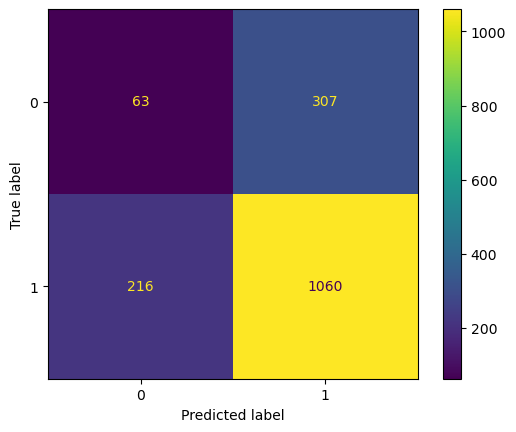

In [124]:
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [128]:
joblib.dump(rf, "C:/Users/saifu/Downloads/datasets/random_forest_model.joblib")

['C:/Users/saifu/Downloads/datasets/random_forest_model.joblib']

In [132]:
joblib.dump(scaler, "C:/Users/saifu/Downloads/datasets/rfcStandardScaler.joblib")

['C:/Users/saifu/Downloads/datasets/rfcStandardScaler.joblib']

In [134]:
def create_vectors_from_messages(messages, messagesPreprocessed):
    corpus = [dictionary.doc2bow(text) for text in messagesPreprocessed] # Term document frequency
    allPreprocessed = messagesPreprocessed
    allBodies = messages
    allVectors = []
    for i in range(len(allBodies)):
        topTopics = ldaModel.get_document_topics(corpus[i], minimum_probability=0.0)
        
        # Can extend this array with other stuff later
        vec = [topTopics[i][1] for i in range(numTopics)] # Topics
    
        for v in doc2VecModel.infer_vector(allPreprocessed[i]): # Doc2Vec
            vec.append(v)
    
        # Sentiment analysis of polarity
        sia = SentimentIntensityAnalyzer()
        sentence = " ".join(allPreprocessed[i])
        polarity = sia.polarity_scores(sentence)
        for s in polarity:
            vec.append(polarity[s])
    
        # Contains HTML
        if "<html>" in allBodies[i].lower():
            vec.append(1)
        else:
            vec.append(0)
    
        # Contains a link
        if "http://" in allBodies[i].lower() or "https://" in allBodies[i].lower():
            vec.append(1)
        else:
            vec.append(0)
    
        # How many blacklisted phrases/words appear in this email
        for b in blackList:
            count = 0
            for word in b:
                if word in allPreprocessed[i]:
                    count += 1
            vec.append(count)
    
        # TF-IDF for top terms
        for w in tfIDF[i]:
            vec.append(w)
    
        # Has all caps word?
        vec.append(count_all_upper_word(allBodies[i]))
    
        # Has exclamation marks?
        vec.append(allBodies[i].count("!"))
    
        # Total length
        vec.append(len(allBodies[i]))
    
        # Num words
        vec.append(len(allPreprocessed[i]))
        
        allVectors.append(vec)

    return allVectors

#box = mailbox.mbox("../datasets/monkey/phishing1.mbox")
box = mailbox.mbox("benign.mbox")
boxMessages = [m[1] for m in box.items()]
    
messages = []
for p in boxMessages:
    body = get_body_from_email(p)
    if body is not None and len(body) > 0:
        messages.append(body)

messagesDecoded = []
for m in messages:
    try:
        d = m.decode("utf-8", errors="ignore")
    except AttributeError:
        d = m
    messagesDecoded.append(d)
messages = messagesDecoded

# Apply preprocessing function to emails
messagesPreprocessed = []
for b in messages:
    p = preprocess_string(b, filters=CUSTOM_FILTERS)
    
    messagesPreprocessed.append(p)

allVectorsTest = create_vectors_from_messages(messages, messagesPreprocessed)
print("Shape of messages: {}".format(np.array(allVectorsTest).shape))

# RFC Prediction
#scaler = StandardScaler()
#scaler.fit(allVectors)
X = scaler.transform(allVectorsTest)
y_pred = rf.predict(X)
numPhishes = 0
for i in y_pred:
    if i == 1:
        numPhishes += 1
print("Phishes: {}. Benign: {}.".format(numPhishes, len(messages)-numPhishes))
gmailLabels = [0 for i in range(len(y_pred))]
gmailAccuracy = accuracy_score(gmailLabels, y_pred)
print(gmailAccuracy)

Shape of messages: (100, 1429)
Phishes: 0. Benign: 100.
1.0


## SVC

In [137]:
#svc = make_pipeline(StandardScaler(), SVC(gamma='auto'))
svc = SVC(gamma="auto")
svc.fit(X_train, y_train)

SVC(gamma='auto')

In [139]:
y_pred = svc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 0.7509113001215066
Precision: 0.7894385026737968
Recall: 0.9255485893416928


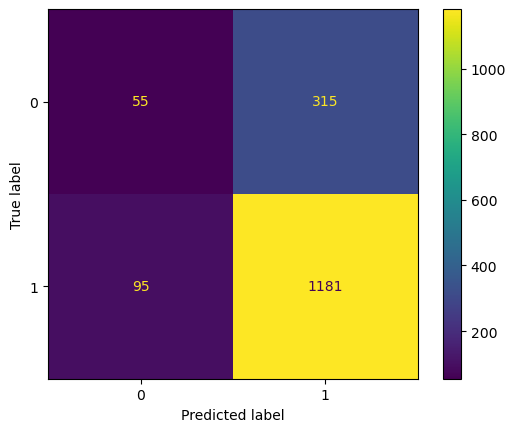

In [141]:
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

# Deep Learning ConvNet (idea from https://keras.io/examples/nlp/text_classification_from_scratch/)

In [144]:
# Disable GPU
print(tf.config.list_physical_devices('GPU'))
tf.config.set_visible_devices([], 'GPU')
print(tf.config.list_physical_devices('GPU'))

[]
[]


In [148]:
input_shape = (1, len(X_train[0]), 1) # Batch size is the first number
print(input_shape)

X_train = allVectors

# Scale data
scaler = StandardScaler()
scaler.fit(X_train)
joblib.dump(scaler, "C:/Users/saifu/Downloads/datasets/cnnScaler.joblib")
X_train = scaler.transform(X_train)

X_train = np.reshape(X_train, (len(X_train), input_shape[1], input_shape[2]))
#print(X_train[30])
print(X_train.shape)
y_train = allLabels
y_train = np.reshape(y_train, (len(X_train), 1))

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, shuffle=True)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1, 1429, 1)
(8227, 1429, 1)
(6581, 1429, 1) (6581, 1) (1646, 1429, 1) (1646, 1)


In [149]:
embedding_dim = 1024
num_layers = 3


inputs = tf.keras.Input(shape=input_shape[1:], dtype="float") # Input vector
x = layers.Conv1D(embedding_dim,2, padding="valid", activation="relu", strides=3)(inputs)
x = layers.Dropout(0.5)(x)
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(x)
x = layers.Dropout(0.5)(x)
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(x)
x = layers.GlobalMaxPooling1D()(x)
x = layers.Dense(embedding_dim, activation="relu")(x)
x = layers.Dropout(0.5)(x)
# We project onto a single unit output layer, and squash it with a sigmoid:
predictions = layers.Dense(1, activation="sigmoid", name="predictions")(x)


model = tf.keras.Model(inputs, predictions)

# Compile the model with binary crossentropy loss and an adam optimizer.
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["binary_accuracy"])

ValueError: Invalid dtype: float

In [151]:
import tensorflow as tf
from tensorflow.keras import layers

embedding_dim = 1024
num_layers = 3

# Ensure input_shape is properly defined before use
input_shape = (None, 100, 1)  # Example input shape (batch_size, timesteps, channels)

inputs = tf.keras.Input(shape=input_shape[1:], dtype="float32")  # Corrected dtype
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(inputs)
x = layers.Dropout(0.5)(x)
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(x)
x = layers.Dropout(0.5)(x)
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(x)
x = layers.GlobalMaxPooling1D()(x)
x = layers.Dense(embedding_dim, activation="relu")(x)
x = layers.Dropout(0.5)(x)
# We project onto a single unit output layer, and squash it with a sigmoid:
predictions = layers.Dense(1, activation="sigmoid", name="predictions")(x)

model = tf.keras.Model(inputs, predictions)

# Compile the model with binary crossentropy loss and an adam optimizer.
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["binary_accuracy"])

# Print model summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 100, 1)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 33, 1024)       │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 33, 1024)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 11, 1024)       │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 11, 1024)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 4, 1024)        │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 1024)           │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,250,049 (20.03 MB)

 Trainable params: 5,250,049 (20.03 MB)

 Non-trainable params: 0 (0.00 B)

In [153]:
epochs = 128

# Fit the model using the train and test datasets.
#model.fit([X_train, y_train], validation_data=[X_test, y_test], epochs=epochs)

history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs)

Epoch 1/128


ValueError: Input 0 of layer "functional" is incompatible with the layer: expected shape=(None, 100, 1), found shape=(None, 1429)

In [155]:
import tensorflow as tf
from tensorflow.keras import layers

# Define model parameters
embedding_dim = 1024
num_layers = 3
epochs = 128

# Ensure input_shape matches your dataset
input_shape = (1429, 1)  # Adjust based on your dataset

# Define the model
inputs = tf.keras.Input(shape=input_shape, dtype="float32")
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(inputs)
x = layers.Dropout(0.5)(x)
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(x)
x = layers.Dropout(0.5)(x)
x = layers.Conv1D(embedding_dim, 2, padding="valid", activation="relu", strides=3)(x)
x = layers.GlobalMaxPooling1D()(x)
x = layers.Dense(embedding_dim, activation="relu")(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(1, activation="sigmoid", name="predictions")(x)

# Compile the model
model = tf.keras.Model(inputs, predictions)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["binary_accuracy"])

# Print model summary
model.summary()

# ✅ Fix dataset shape before training
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))  # Convert to 3D
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))  # Convert to 3D

# Train the model
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 1429, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 476, 1024)      │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 476, 1024)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 159, 1024)      │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 159, 1024)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 53, 1024)       │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_1          │ (None, 1024)           │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,250,049 (20.03 MB)

 Trainable params: 5,250,049 (20.03 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/128
206/206 ━━━━━━━━━━━━━━━━━━━━ 137s 647ms/step - binary_accuracy: 0.7777 - loss: 0.5546 - val_binary_accuracy: 0.7825 - val_loss: 0.4894
Epoch 2/128
206/206 ━━━━━━━━━━━━━━━━━━━━ 136s 659ms/step - binary_accuracy: 0.7924 - loss: 0.4785 - val_binary_accuracy: 0.7819 - val_loss: 0.4712
Epoch 3/128
206/206 ━━━━━━━━━━━━━━━━━━━━ 136s 660ms/step - binary_accuracy: 0.7916 - loss: 0.4502 - val_binary_accuracy: 0.7825 - val_loss: 0.4877
Epoch 4/128
206/206 ━━━━━━━━━━━━━━━━━━━━ 136s 659ms/step - binary_accuracy: 0.7945 - loss: 0.4493 - val_binary_accuracy: 0.7734 - val_loss: 0.4545
Epoch 5/128
206/206 ━━━━━━━━━━━━━━━━━━━━ 284s 1s/step - binary_accuracy: 0.7843 - loss: 0.4310 - val_binary_accuracy: 0.7813 - val_loss: 0.4737
Epoch 6/128
206/206 ━━━━━━━━━━━━━━━━━━━━ 137s 663ms/step - binary_accuracy: 0.7979 - loss: 0.4276 - val_binary_accuracy: 0.7710 - val_loss: 0.4348
Epoch 7/128
206/206 ━━━━━━━━━━━━━━━━━━━━ 136s 660ms/step - binary_accuracy: 0.7908 - loss: 0.4168 - val_binary_accuracy: 

KeyboardInterrupt: 

In [ ]:
# Test on my gmail inbox
def create_vectors_from_messages(messages, messagesPreprocessed):
    corpus = [dictionary.doc2bow(text) for text in messagesPreprocessed] # Term document frequency
    allPreprocessed = messagesPreprocessed
    allBodies = messages
    allVectors = []
    for i in range(len(allBodies)):
        topTopics = ldaModel.get_document_topics(corpus[i], minimum_probability=0.0)
        
        # Can extend this array with other stuff later
        vec = [topTopics[i][1] for i in range(numTopics)] # Topics
    
        for v in doc2VecModel.infer_vector(allPreprocessed[i]): # Doc2Vec
            vec.append(v)
    
        # Sentiment analysis of polarity
        sia = SentimentIntensityAnalyzer()
        sentence = " ".join(allPreprocessed[i])
        polarity = sia.polarity_scores(sentence)
        for s in polarity:
            vec.append(polarity[s])
    
        # Contains HTML
        if "<html>" in allBodies[i].lower():
            vec.append(1)
        else:
            vec.append(0)
    
        # Contains a link
        if "http://" in allBodies[i].lower() or "https://" in allBodies[i].lower():
            vec.append(1)
        else:
            vec.append(0)
    
        # How many blacklisted phrases/words appear in this email
        for b in blackList:
            count = 0
            for word in b:
                if word in allPreprocessed[i]:
                    count += 1
            vec.append(count)
    
        # TF-IDF for top terms
        for w in tfIDF[i]:
            vec.append(w)
    
        # Has all caps word?
        vec.append(count_all_upper_word(allBodies[i]))
    
        # Has exclamation marks?
        vec.append(allBodies[i].count("!"))
    
        # Total length
        vec.append(len(allBodies[i]))
    
        # Num words
        vec.append(len(allPreprocessed[i]))
        
        allVectors.append(vec)

    return allVectors

#box = mailbox.mbox("../datasets/monkey/phishing1.mbox")
box = mailbox.mbox("benign.mbox")
boxMessages = [m[1] for m in box.items()]
    
messages = []
for p in boxMessages:
    body = get_body_from_email(p)
    if body is not None and len(body) > 0:
        messages.append(body)

messagesDecoded = []
for m in messages:
    try:
        d = m.decode("utf-8", errors="ignore")
    except AttributeError:
        d = m
    messagesDecoded.append(d)
messages = messagesDecoded

# Apply preprocessing function to emails
messagesPreprocessed = []
for b in messages:
    p = preprocess_string(b, filters=CUSTOM_FILTERS)
    
    messagesPreprocessed.append(p)

allVectorsTest = create_vectors_from_messages(messages, messagesPreprocessed)
print("Shape of messages: {}".format(np.array(allVectorsTest).shape))

# RFC Prediction
#scaler = StandardScaler()
#scaler.fit(allVectors)
X = scaler.transform(allVectorsTest)
#y_pred = rf.predict(X)
y_pred = model.predict(X)

In [ ]:
y_pred_bin = []
numPhishesCNN = 0
for i in y_pred:
    if i > 0.5:
        y_pred_bin.append(1)
        numPhishesCNN += 1
    else:
        y_pred_bin.append(0)
print("Phishes: {}. Benign: {}.".format(numPhishesCNN, len(messages)-numPhishesCNN))
gmailAccuracyCNN = accuracy_score(gmailLabels, y_pred_bin) 
print(gmailAccuracyCNN)

In [ ]:
model.save("../models/cnn_{}l_{}d_{}e.keras".format(num_layers, embedding_dim, epochs))

In [ ]:
statsFilename = "../results/stats.csv"
if os.path.isfile(statsFilename):
    outData = {"Num Topics" : [], "TF-IDF Count" : [], "Num Training" : [], "Num Test" : [], "RFC Test Accuracy" : [], "RFC Test Recall" : [], "RFC GMail Accuracy" : [], "CNN Dim" : [], "CNN Num Layers" : [], 
               "CNN Accuracy" : [], "CNN Validation Accuracy" : [], "CNN GMail Accuracy" : [] }
    outData["Num Topics"].append(numTopics)
    outData["TF-IDF Count"].append(maximumTermCount)
    outData["Num Training"].append(len(X_train))
    outData["Num Test"].append(len(X_test))
    outData["RFC Test Accuracy"].append(rfcAccuracy)
    outData["RFC Test Recall"].append(rfcRecall)
    outData["RFC GMail Accuracy"].append(gmailAccuracy)
    outData["CNN Dim"].append(embedding_dim)
    outData["CNN Num Layers"].append(num_layers)
    outData["CNN Accuracy"].append(history.history["binary_accuracy"][-1])
    outData["CNN Validation Accuracy"].append(history.history["val_binary_accuracy"][-1])
    outData["CNN GMail Accuracy"].append(gmailAccuracyCNN)

    outDataFrame = pd.DataFrame(outData)
    
    df = pd.read_csv(statsFilename)
    print(df)
    #df = pd.concat([df, pd.DataFrame(outData)], ignore_index=True)
    outDataFrame["ID"] = len(df)
    outDataFrame.set_index("ID")
    print(outDataFrame)
    #df.loc[len(df)] = outDataFrame
    df = pd.concat([df, pd.DataFrame(outData)], ignore_index=True)
    df.to_csv(statsFilename, index=False)
else:
    outData = {"Num Topics" : [], "TF-IDF Count" : [], "Num Training" : [], "Num Test" : [], "RFC Test Accuracy" : [], "RFC Test Recall" : [], "RFC GMail Accuracy" : [], "CNN Dim" : [], "CNN Num Layers" : [], 
               "CNN Accuracy" : [], "CNN Validation Accuracy" : [], "CNN GMail Accuracy" : [] }
    outData["Num Topics"].append(numTopics)
    outData["TF-IDF Count"].append(maximumTermCount)
    outData["Num Training"].append(len(X_train))
    outData["Num Test"].append(len(X_test))
    outData["RFC Test Accuracy"].append(rfcAccuracy)
    outData["RFC Test Recall"].append(rfcRecall)
    outData["RFC GMail Accuracy"].append(gmailAccuracy)
    outData["CNN Dim"].append(embedding_dim)
    outData["CNN Num Layers"].append(num_layers)
    outData["CNN Accuracy"].append(history.history["binary_accuracy"][-1])
    outData["CNN Validation Accuracy"].append(history.history["val_binary_accuracy"][-1])
    outData["CNN GMail Accuracy"].append(gmailAccuracyCNN)
    df = pd.DataFrame(outData)
    df.to_csv(statsFilename)